In [18]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
import dlib
import time

from random import seed
from random import randint
# seed random number generator
seed(1)

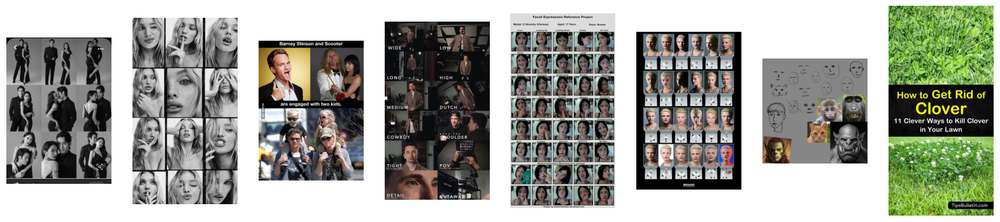

In [61]:
#load and show images
path = 'Data/'
imgNames = ['Image01','Image02','Image03','Image04','Image05','Image06', 'Image08', 'Image09']

imgs = []
grays = []
for i in imgNames:
    img =  cv2.imread(path + i + '.jpg')
    img =  cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    imgs.append(img)
    grays.append(gray)
    
plt.rcParams['figure.figsize'] = [20, 20]
imgPos = 1
for i in imgs:
    plt.subplot(1,len(imgs), imgPos), plt.imshow(i)
    plt.axis(False)
    imgPos += 1

In [30]:
# convert Dlib rect --> OpenCV rect
def rect_to_bb(rect):
    x = rect.left()
    y = rect.top()
    w = rect.right() - x
    h = rect.bottom() - y

    return (x, y, w, h)

# function for detection using dlib
def detect_faces(image):  
    start = time.time()
    
    #Loading detector
    detector = dlib.get_frontal_face_detector()
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    rects = detector(gray, 1)
    print('Number of detected faces:', len(rects))
    
    # Draw rectangle around the face
    result_dlib = np.copy(image)
    faces_dlib_img = []
    for rect in rects:    
        x, y, w, h = rect_to_bb(rect)
        cv2.rectangle(result_dlib, (x, y), (x+w, y+h), (randint(120, 255), randint(120, 255), randint(120, 255)), 3)
        faces_dlib_img.append(image[y:y+h, x:x+w, :])
    end = time.time()
    print("Face detection took {:.4f} seconds".format(end - start))
    return result_dlib

Number of detected faces: 5
Face detection took 0.3330 seconds


(<matplotlib.image.AxesImage at 0x2693082b2e0>, Text(0.5, 1.0, 'dlib'))

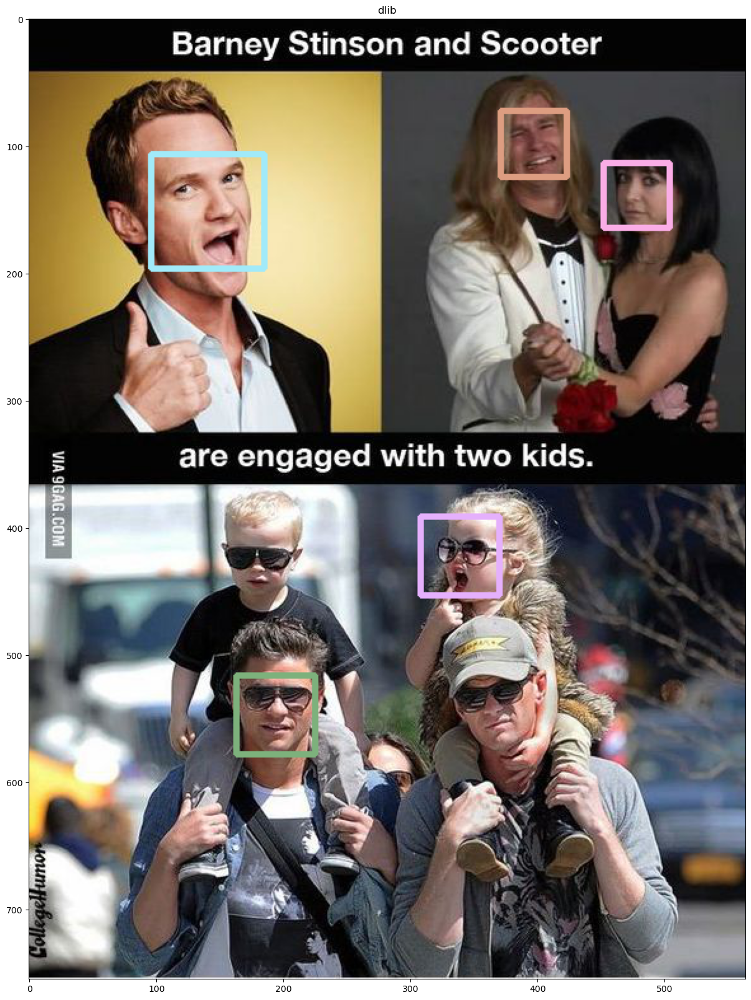

In [31]:
result = detect_faces(imgs[2])
plt.imshow(result), plt.title('dlib')

Number of detected faces: 7
Face detection took 0.3341 seconds


(<matplotlib.image.AxesImage at 0x269301e7580>, Text(0.5, 1.0, 'dlib'))

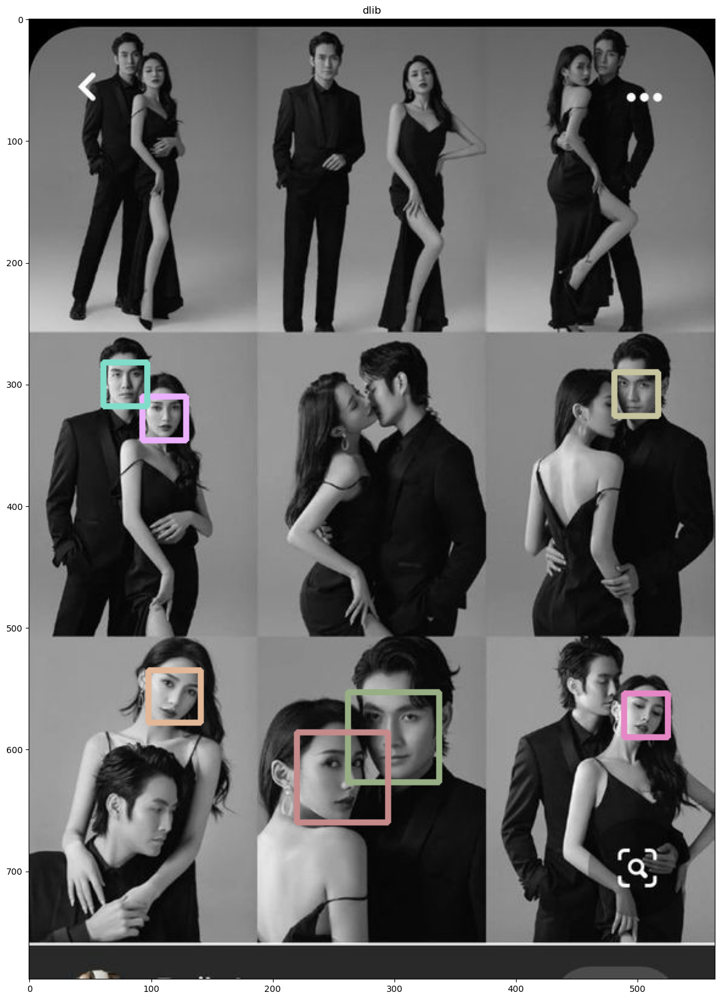

In [32]:
result = detect_faces(imgs[0])
plt.imshow(result), plt.title('dlib')

Number of detected faces: 10
Face detection took 0.3776 seconds


(<matplotlib.image.AxesImage at 0x26936007eb0>, Text(0.5, 1.0, 'dlib'))

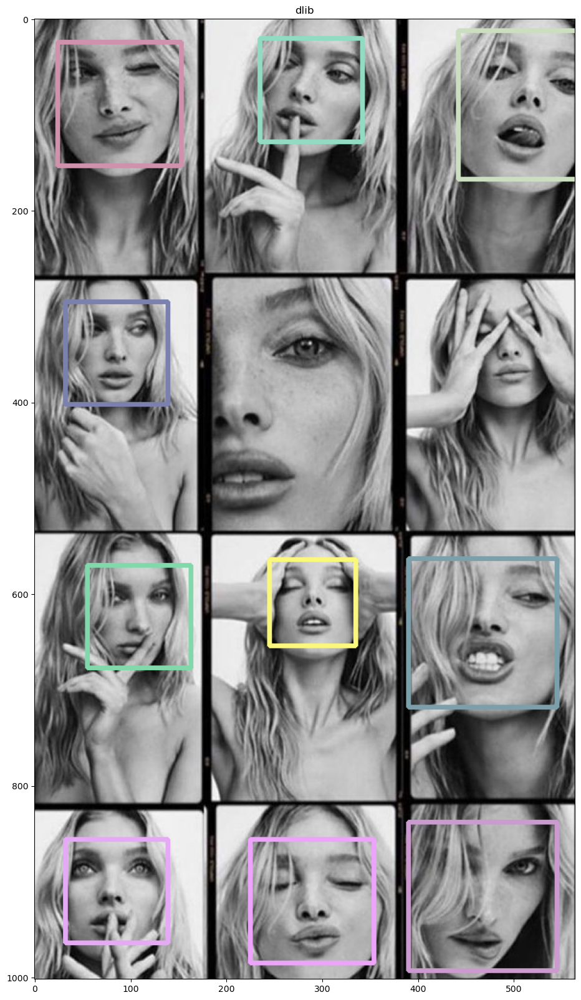

In [33]:
result = detect_faces(imgs[1])
plt.imshow(result), plt.title('dlib')

Number of detected faces: 3
Face detection took 0.4252 seconds


(<matplotlib.image.AxesImage at 0x2692bbc29d0>, Text(0.5, 1.0, 'dlib'))

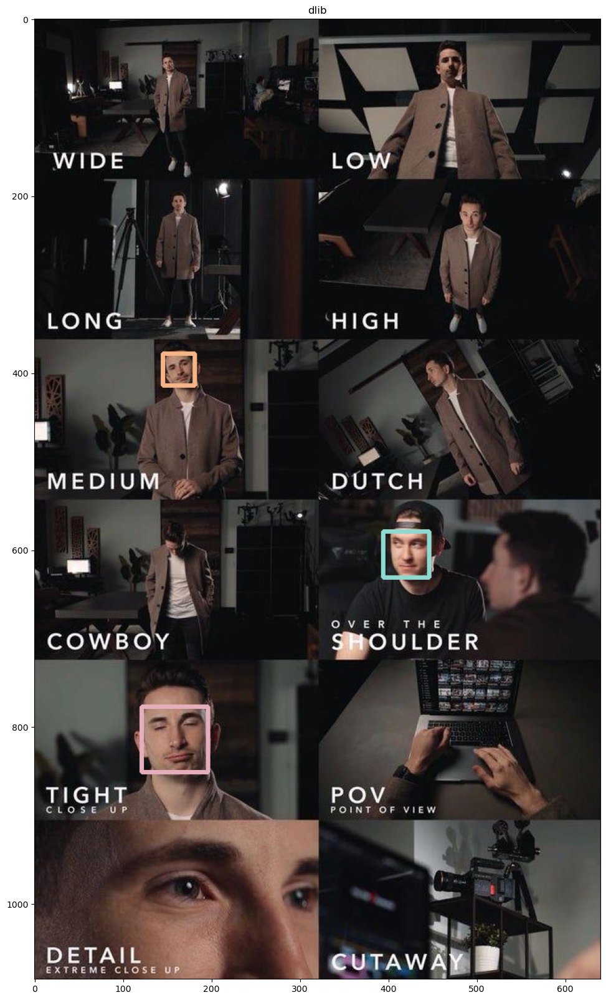

In [34]:
result = detect_faces(imgs[3])
plt.imshow(result), plt.title('dlib')

Number of detected faces: 37
Face detection took 1.5910 seconds


(<matplotlib.image.AxesImage at 0x2693396bdc0>, Text(0.5, 1.0, 'dlib'))

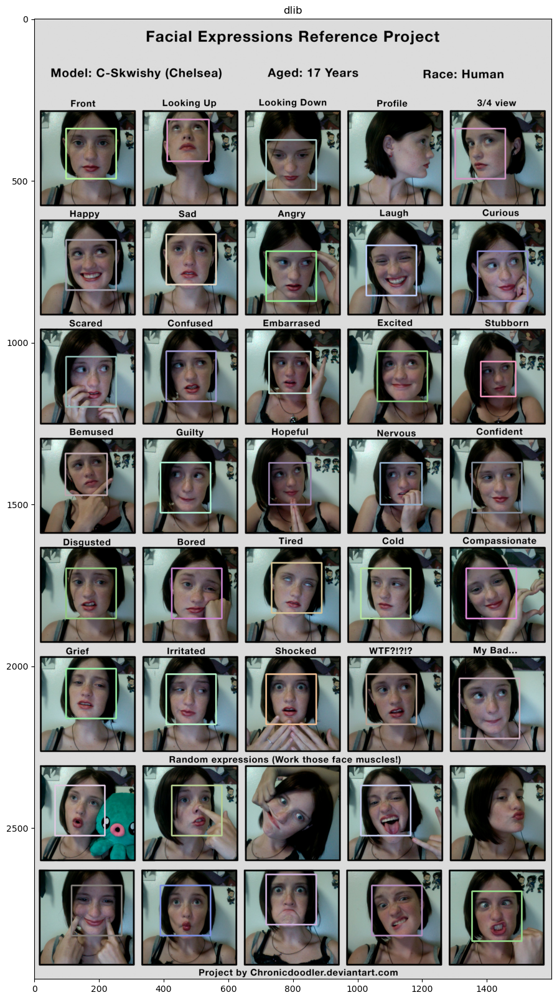

In [35]:
result = detect_faces(imgs[4])
plt.imshow(result), plt.title('dlib')

Number of detected faces: 20
Face detection took 0.4480 seconds


(<matplotlib.image.AxesImage at 0x2692fd0ebe0>, Text(0.5, 1.0, 'dlib'))

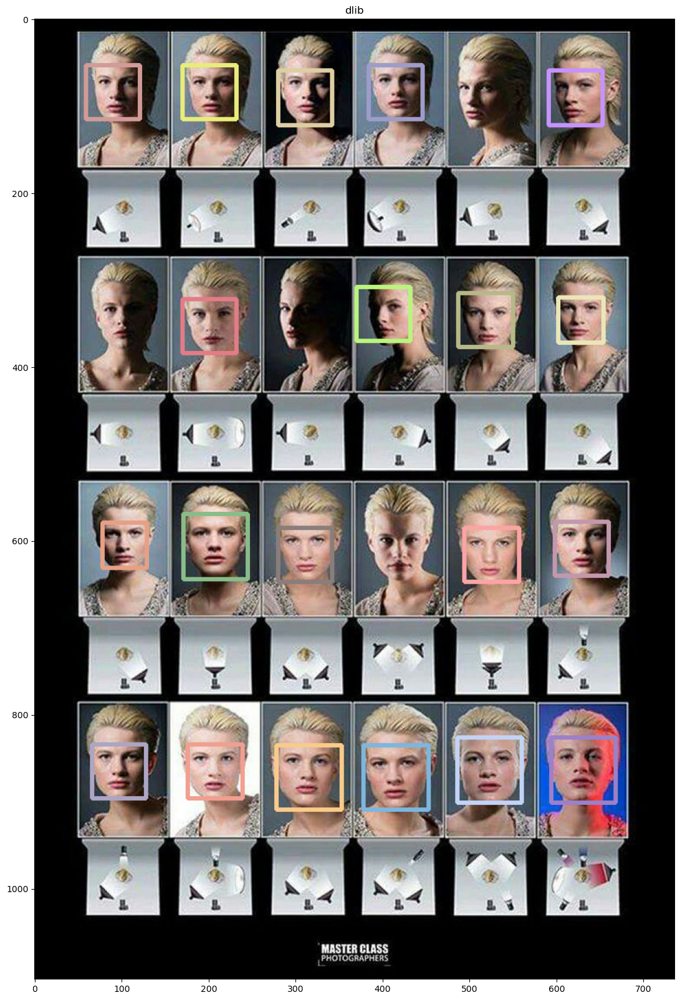

In [36]:
result = detect_faces(imgs[5])
plt.imshow(result), plt.title('dlib')

<h2>Questions</h2>
<b>How does the detector perform? Is it robust?</b><br>
<i>I think it works perfect. Very usefull tool to detect faces in case when:<br>
-we can see entire face(not only part of it)<br>
-the face has no rotation offset, or has a small rotation offset<br>
-the face has enough illumination to see keyfeatures<br>
-the face have enough resolution(small faces about 15x15px also with noise artifacts are hard to detect)<br>
-the face has no too big unproportional glasses or hats that cover big area<br>

Also I want to notice than I haven't got any false detection so I decided to make an experiment, and take not human faces and draw some faces by my own -)
</i>

Number of detected faces: 15
Face detection took 0.4950 seconds


(<matplotlib.image.AxesImage at 0x2692bce4700>, Text(0.5, 1.0, 'dlib'))

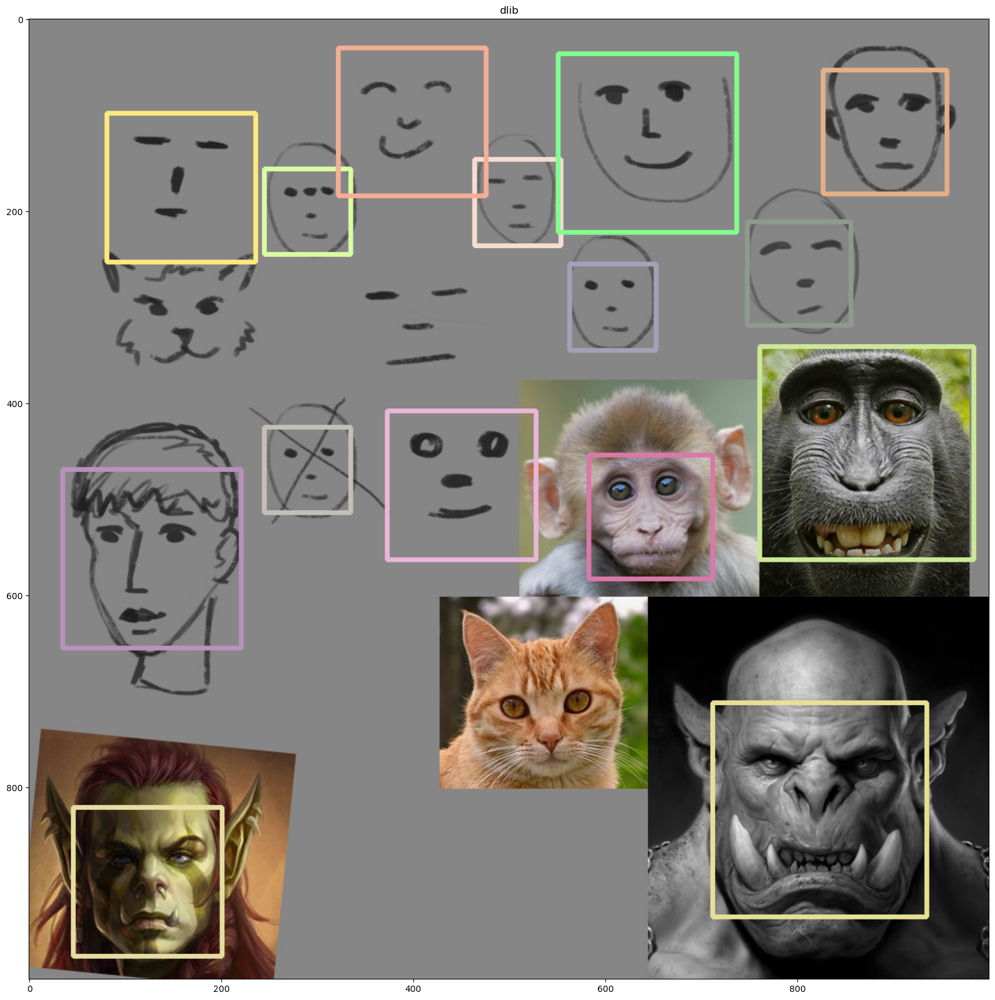

In [62]:
result = detect_faces(imgs[6])
plt.imshow(result), plt.title('dlib')

<i>And the result is amazing!
Everything that a bit similar to human face detected as face, even stick drawing...
Considering this we can make a conclusion that this algorithm can find faces in a noisy background if background features will match human face features.
</i>

Number of detected faces: 1
Face detection took 0.3970 seconds


(<matplotlib.image.AxesImage at 0x2692cf93be0>, Text(0.5, 1.0, 'dlib'))

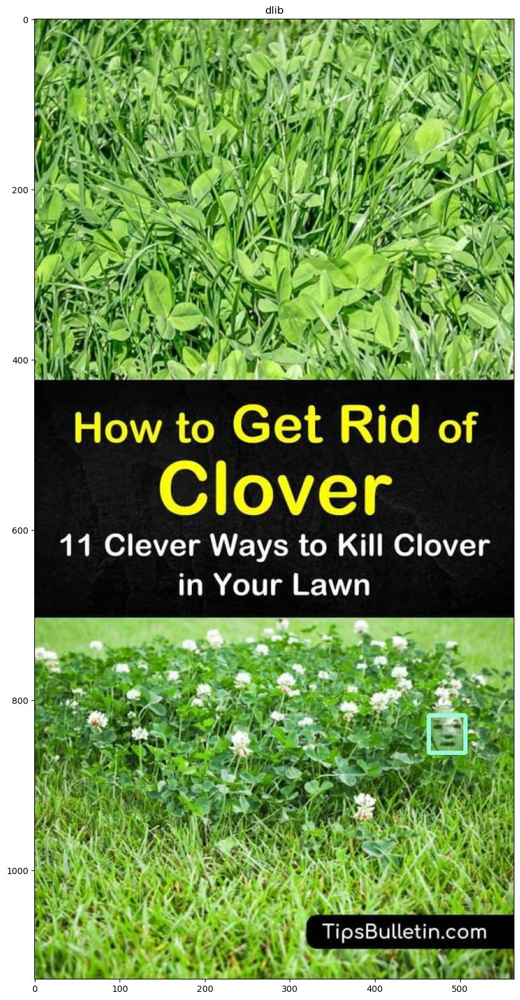

In [60]:
result = detect_faces(imgs[7])
plt.imshow(result), plt.title('dlib')

<i>But!!!! I've tried a bunch of images with stone, leaves, grass, mountains and noises. And haven't found any faces there, until drew one by myself))) Seems like the algorithm considering on not only where keyfeatures have to be, but also on where shouldn't be any keyfeatures<br>
    So the algorithm is very robust!-)</i>

<h2>Thanks for viewing!</h2> ❤️️